# PSN

In [1]:
import os
import anndata as ad
import scipy as sp
import pickle
import pandas as pd
import igraph as ig
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

In [2]:
"""
The data folder is structured as follows:

data
    |input
        |original
        |pb
        |pb_L
    |output
        |corr
        |gk
        |corr_L
        |extra
"""

data = os.path.abspath(os.path.join(os.getcwd(),"../data"))

input = os.path.join(data, "input")
output = os.path.join(data, "output")

original = os.path.join(input, "original")
pb = os.path.join(input, "pb")
pb_L = os.path.join(input, "pb_L")

corr = os.path.join(output, "corr")
gk = os.path.join(output, "gk")
corr_L = gk = os.path.join(output, "corr_L")
extra = os.path.join(output, "extra")

## Loading Data

In [3]:
# Read Original Data
adt = ad.read_h5ad(os.path.join(original, "adt_pp.h5ad"))
bulkRNA = ad.read_h5ad(os.path.join(original, "bulkRNA_pp.h5ad"))
cytof = ad.read_h5ad (os.path.join(original, "cytof_pp.h5ad"))
facs = ad.read_h5ad(os.path.join(original, "facs_pp.h5ad"))
luminex = ad.read_h5ad(os.path.join(original, "luminex_pp.h5ad"))
scRNA = ad.read_h5ad(os.path.join(original, "scRNA_pp.h5ad"))

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation

In [4]:
# Read Pseudobulks
with open(os.path.join(pb_L, "citeRNA_pseudobulks.pickle"), "rb") as f:
    citeRNA_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "adt_pseudobulks.pickle"), "rb") as f:
    adt_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "cytof_pseudobulks.pickle"), "rb") as f:
    cytof_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "bulkRNA_pseudobulks.pickle"), "rb") as f:
    bulkRNA_pseudobulks = pickle.load(f) # Float

luminex_pseudobulks = pd.read_csv(os.path.join(pb_L, "luminex_pseudobulks.csv"), index_col = 0) # Float
facs_pseudobulks = pd.read_csv(os.path.join(pb_L, "facs_pseudobulks.csv"), index_col = 0)

In [5]:
# Correlations
with open(os.path.join(corr_L,'citeRNA_disease_clusters_corr.pickle'), 'rb') as f:
    citeRNA_disease_clusters_corr = pickle.load(f)

with open(os.path.join(corr_L,'corr_p_citeRNA.pickle'), 'rb') as f:
    corr_p_citeRNA = pickle.load(f)

with open(os.path.join(corr_L,'adt_disease_clusters_corr.pickle'), 'rb') as f:
    adt_disease_clusters_corr = pickle.load(f)

with open(os.path.join(corr_L,'corr_p_adt.pickle'), 'rb') as f:
    corr_p_adt = pickle.load(f)

with open(os.path.join(corr_L, 'cytof_disease_clusters_corr.pickle'), 'rb') as f:
    cytof_disease_clusters_corr = pickle.load(f)

with open(os.path.join(corr_L, 'corr_p_cytof.pickle'), 'rb') as f:
    corr_p_cytof = pickle.load(f)

with open(os.path.join(corr_L, 'corr_p_d_cytof.pickle'), 'rb') as f:
    corr_p_d_cytof = pickle.load(f)

with open(os.path.join(corr_L, 'bulkRNA_disease_clusters_corr.pickle'), 'rb') as f:
    bulkRNA_disease_clusters_corr = pickle.load(f)

with open(os.path.join(corr_L, 'corr_p_bulkRNA.pickle'), 'rb') as f:
    corr_p_bulkRNA = pickle.load(f)

with open(os.path.join(corr_L, 'corr_p_luminex.pickle'), 'rb') as f:
    corr_p_luminex = pickle.load(f)

with open(os.path.join(corr_L, 'luminex_disease_clusters_corr.pickle'), 'rb') as f:
    luminex_disease_clusters_corr = pickle.load(f)

with open(os.path.join(corr_L, 'corr_p_facs.pickle'), 'rb') as f:
    corr_p_facs = pickle.load(f)

with open(os.path.join(corr_L, 'facs_disease_clusters_corr.pickle'), 'rb') as f:
    facs_disease_clusters_corr = pickle.load(f)

corr_d_luminex = pd.read_csv(os.path.join(corr_L, "corr_d_luminex.csv"), index_col = 0) 
corr_d_facs = pd.read_csv(os.path.join(corr_L, "corr_d_facs.csv"), index_col = 0)
corr_p_d_facs = pd.read_csv(os.path.join(corr_L, "corr_p_d_facs.csv"), index_col = 0)
corr_p_d_luminex = pd.read_csv(os.path.join(corr_L, "corr_p_d_luminex.csv"), index_col = 0)

## Graph Computation

### FACS

In [6]:
facs_graph_sum = {}
n_vertices = len(corr_p_facs.index.unique())
facs_graph_sum["num_vertices"] = n_vertices

In [7]:
data = corr_p_facs.to_numpy()
data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
data = data[data>0] # Discard negative correlation 
data = data[data<1] # Discard correlation with self

In [8]:
percentile = np.percentile(data, 90) 
data_10 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_facs.iloc[i,j] >= percentile]
facs_graph_sum["10"] = {"corr_data": data_10, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 95) 
data_5 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_facs.iloc[i,j] >= percentile]
facs_graph_sum["5"] = {"corr_data": data_5, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 97) 
data_3 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_facs.iloc[i,j] >= percentile]
facs_graph_sum["3"] = {"corr_data": data_3, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 99) 
data_1 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_facs.iloc[i,j] >= percentile]
facs_graph_sum["1"] = {"corr_data": data_1, "percentile_threshhold": percentile, "edges": edges}

#### Example Visualization

In [9]:
# Original Graph
g = ig.Graph(facs_graph_sum["num_vertices"], facs_graph_sum["10"]["edges"])
g["title"] = "FACS Network for Top 10 Edges"
g.vs["name"] = list(corr_p_facs.columns)
g.vs["disease"] =  [facs.obs.Diseases[facs.obs_names == name][0] for name in g.vs["name"] ]
g.vs["gender"] =  [facs.uns["experiment_info"][facs.uns["experiment_info"]["scRNASeq_sample_ID"] == name]["Sex"][0] for name in g.vs["name"] ]
g.vs["age"] = [facs.uns["experiment_info"][facs.uns["experiment_info"]["scRNASeq_sample_ID"] == name]["Age"][0] for name in g.vs["name"] ]

In [10]:
fig, ax = plt.subplots(figsize=(facs_graph_sum["num_vertices"],facs_graph_sum["num_vertices"]))
ig.plot(
    g,
    target=ax,
    layout="auto", 
    vertex_size=0.03,
    vertex_color=["blue" if gender == "F" else "red" for gender in g.vs["gender"]],
    vertex_frame_width=3.0,
    vertex_frame_color="white",
    vertex_label=g.vs["name"],
    vertex_label_size=9.0,
)

plt.show()

In [11]:
# Communities
communities = g.community_edge_betweenness()
communities = communities.as_clustering()

num_communities = len(communities)
palette = ig.RainbowPalette(n=num_communities)
for i, community in enumerate(communities):
    g.vs[community]["color"] = i
    community_edges = g.es.select(_within=community)
    community_edges["color"] = i

fig, ax = plt.subplots(figsize=(facs_graph_sum["num_vertices"],facs_graph_sum["num_vertices"]))
ig.plot(
    communities,
    palette=palette,
    edge_width=1,
    target=ax,
    vertex_size=0.3,
)

# Create a custom color legend
legend_handles = []
for i in range(num_communities):
    handle = ax.scatter(
        [], [],
        s=100,
        facecolor=palette.get(i),
        edgecolor="k",
        label=i,
    )
    legend_handles.append(handle)
ax.legend(
    handles=legend_handles,
    title='Community:',
    bbox_to_anchor=(0, 1.0),
    bbox_transform=ax.transAxes,
)
plt.show()

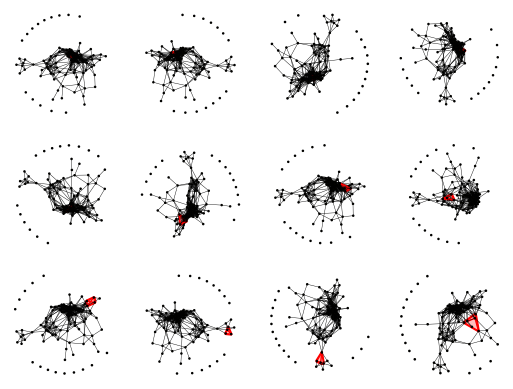

In [12]:
# Cliques
cliques = g.cliques(4, 4)

fig, axs = plt.subplots(3, 4)
axs = axs.ravel()
for clique, ax in zip(cliques, axs):
    # Color vertices yellow/red based on whether they are in this clique
    g.vs['color'] = 'yellow'
    g.vs[clique]['color'] = 'red'

    # Color edges black/red based on whether they are in this clique
    clique_edges = g.es.select(_within=clique)
    g.es['color'] = 'black'
    clique_edges['color'] = 'red'
    # also increase thickness of clique edges
    g.es['width'] = 0.3
    clique_edges['width'] = 1

    ig.plot(
        ig.VertexCover(g, [clique]),
        mark_groups=True,
        palette=ig.RainbowPalette(),
        target=ax,
    )
plt.axis('off')
plt.show()

### CyTOF

In [13]:
cytof_graph_sum = {}

for key in corr_p_cytof.keys():
    df = corr_p_cytof[key]
    n_vertices = len(df.index.unique())

    data = df.to_numpy()
    data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
    data = data[data>0] # Discard negative correlation 
    data = data[data<1] # Discard correlation with self

    percentile_10 = np.percentile(data, 90) 
    data_10 = data [data >= percentile_10] # Extract the top 10% percent correlation  
    edges_10 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_10]

    percentile_5 = np.percentile(data, 95) 
    data_5 = data [data >= percentile_5] # Extract the top 5% percent correlation  
    edges_5 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_5]

    percentile_3 = np.percentile(data, 97) 
    data_3 = data [data >= percentile_3] # Extract the top 3% percent correlation  
    edges_3 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_3]

    percentile_1 = np.percentile(data, 99) 
    data_1 = data [data >= percentile_1] # Extract the top 1% percent correlation  
    edges_1 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_1]

    cytof_graph_sum[key] = {"num_vertices": n_vertices, "10": {"corr_data": data_10, "percentile_threshhold": percentile_10, "edges": edges_10 }, "5": {"corr_data": data_5,  "percentile_threshhold": percentile_5, "edges": edges_5}, "3": {"corr_data": data_3, "percentile_threshhold": percentile_3, "edges": edges_3}, "1": {"corr_data": data_1, "percentile_threshhold": percentile_1, "edges": edges_1 } }


### ADT

In [14]:
adt_graph_sum = {}

for key in corr_p_adt.keys():
    df = corr_p_adt[key]
    n_vertices = len(df.index.unique())

    data = df.to_numpy()
    data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
    data = data[data>0] # Discard negative correlation 
    data = data[data<1] # Discard correlation with self

    percentile_10 = np.percentile(data, 90) 
    data_10 = data [data >= percentile_10] # Extract the top 10% percent correlation  
    edges_10 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_10]

    percentile_5 = np.percentile(data, 95) 
    data_5 = data [data >= percentile_5] # Extract the top 10% percent correlation  
    edges_5 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_5]

    percentile_3 = np.percentile(data, 97) 
    data_3 = data [data >= percentile_3] # Extract the top 10% percent correlation  
    edges_3 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_3]

    percentile_1 = np.percentile(data, 99) 
    data_1 = data [data >= percentile_1] # Extract the top 1% percent correlation  
    edges_1 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_1]

    adt_graph_sum[key] = {"num_vertices": n_vertices, "10": {"corr_data": data_10, "percentile_threshhold": percentile_10, "edges": edges_10 }, "5": {"corr_data": data_5,  "percentile_threshhold": percentile_5, "edges": edges_5}, "3": {"corr_data": data_3, "percentile_threshhold": percentile_3, "edges": edges_3}, "1": {"corr_data": data_1, "percentile_threshhold": percentile_1, "edges": edges_1}}


### citeRNA

In [15]:
citeRNA_graph_sum = {}

for key in corr_p_citeRNA.keys():
    df = corr_p_citeRNA[key]
    n_vertices = len(df.index.unique())

    data = df.to_numpy()
    data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
    data = data[data>0] # Discard negative correlation 
    data = data[data<1] # Discard correlation with self

    percentile_10 = np.percentile(data, 90) 
    data_10 = data [data >= percentile_10] # Extract the top 10% percent correlation  
    edges_10 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_10]

    percentile_5 = np.percentile(data, 95) 
    data_5 = data [data >= percentile_5] # Extract the top 5% percent correlation  
    edges_5 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_5]

    percentile_3 = np.percentile(data, 97) 
    data_3 = data [data >= percentile_3] # Extract the top 3% percent correlation  
    edges_3 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_3]

    percentile_1 = np.percentile(data, 99) 
    data_1 = data [data >= percentile_1] # Extract the top 1% percent correlation  
    edges_1 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_1]

    citeRNA_graph_sum[key] = {"num_vertices": n_vertices, "10": {"corr_data": data_10, "percentile_threshhold": percentile_10, "edges": edges_10 }, "5": {"corr_data": data_5,  "percentile_threshhold": percentile_5, "edges": edges_5}, "3": {"corr_data": data_3, "percentile_threshhold": percentile_3, "edges": edges_3}, "1": {"corr_data": data_1, "percentile_threshhold": percentile_1, "edges": edges_1}}



### bulkRNA

In [16]:
bulkRNA_graph_sum = {}

for key in corr_p_bulkRNA.keys():
    df = corr_p_bulkRNA[key]
    n_vertices = len(df.index.unique())

    data = df.to_numpy()
    data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
    data = data[data>0] # Discard negative correlation 
    data = data[data<1] # Discard correlation with self

    percentile_10 = np.percentile(data, 90) 
    data_10 = data [data >= percentile_10] # Extract the top 10% percent correlation  
    edges_10 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_10]

    percentile_5 = np.percentile(data, 95) 
    data_5 = data [data >= percentile_5] # Extract the top 5% percent correlation  
    edges_5 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_5]

    percentile_3 = np.percentile(data, 97) 
    data_3 = data [data >= percentile_3] # Extract the top 3% percent correlation  
    edges_3 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_3]

    percentile_1 = np.percentile(data, 99) 
    data_1 = data [data >= percentile_1] # Extract the top 1% percent correlation  
    edges_1 = [(i,j) for i in range(n_vertices) for j in range(i) if df.iloc[i,j] >= percentile_1]

    bulkRNA_graph_sum[key] = {"num_vertices": n_vertices, "10": {"corr_data": data_10, "percentile_threshhold": percentile_10, "edges": edges_10 }, "5": {"corr_data": data_5,  "percentile_threshhold": percentile_5, "edges": edges_5}, "3": {"corr_data": data_3, "percentile_threshhold": percentile_3, "edges": edges_3}, "1": {"corr_data": data_1, "percentile_threshhold": percentile_1, "edges": edges_1}}


#### Example Visuaization

In [17]:
# Original Graph
n_vertices = bulkRNA_graph_sum["cyan"]["num_vertices"]
edges = bulkRNA_graph_sum["cyan"]["1"]["edges"]

g = ig.Graph(n_vertices, edges)

g["title"] = "bulkRNA Network for cyan module and top 1 percent edges"
g.vs["name"] = list(df.columns)

# Communities
communities = g.community_edge_betweenness()
communities = communities.as_clustering()

num_communities = len(communities)
palette = ig.RainbowPalette(n=num_communities)
for i, community in enumerate(communities):
    g.vs[community]["color"] = i
    community_edges = g.es.select(_within=community)
    community_edges["color"] = i

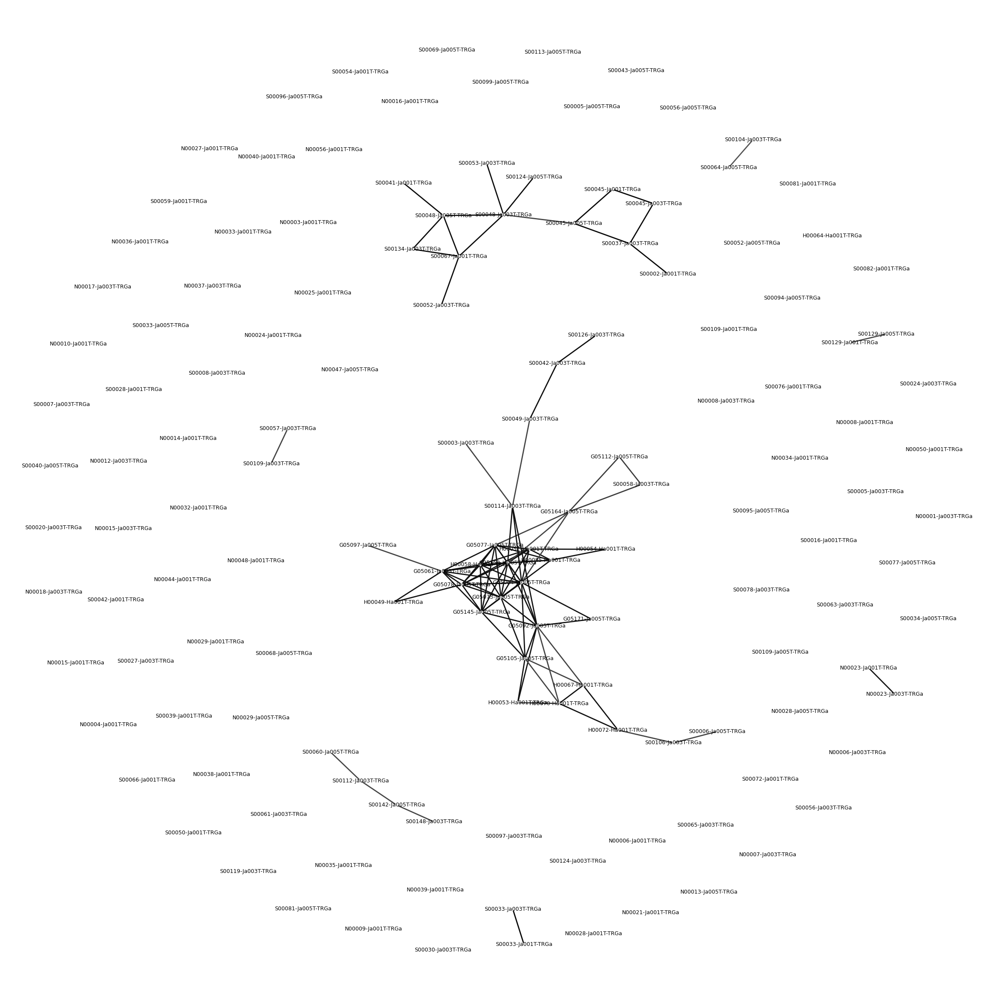

In [18]:
fig, ax = plt.subplots(figsize=(30,30))
ig.plot(
    g,
    target=ax,
    layout="auto", 
    vertex_size=0.03,
    vertex_frame_width=3.0,
    vertex_frame_color="white",
    vertex_label=g.vs["name"],
    vertex_label_size=9.0,
)

plt.show()

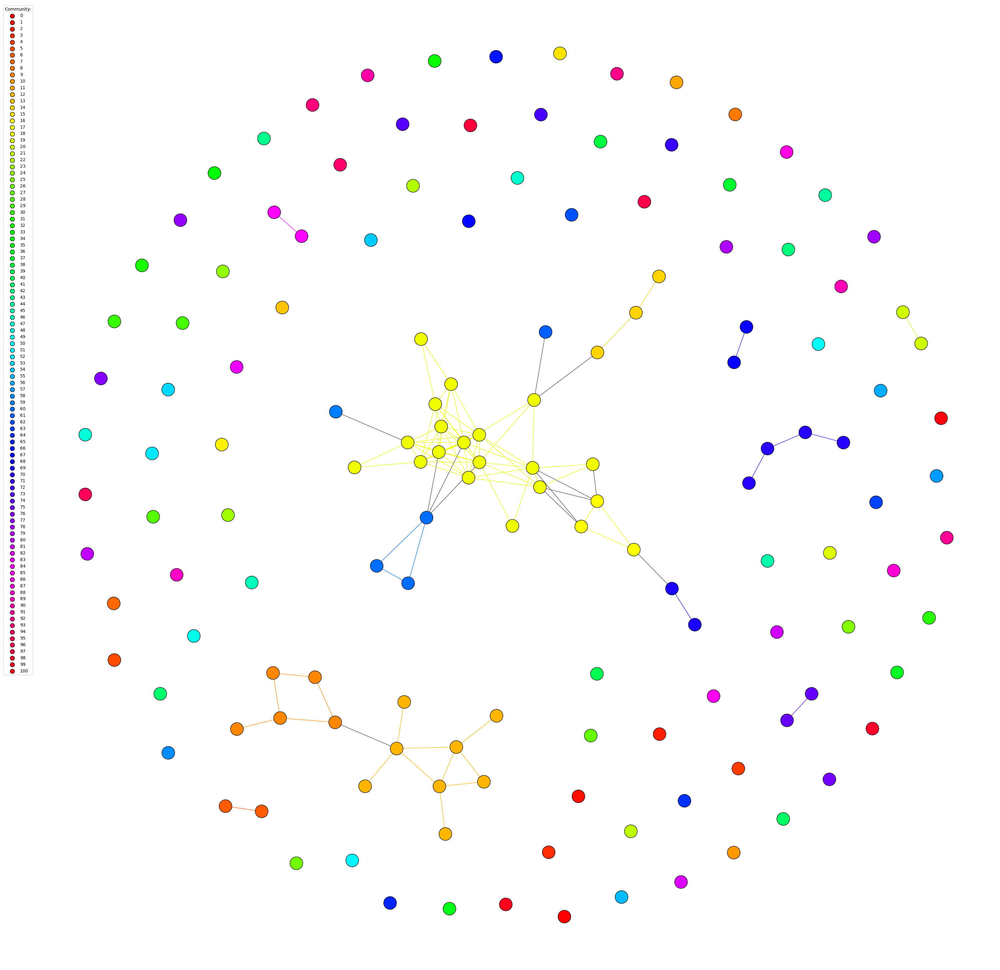

In [19]:
fig, ax = plt.subplots(figsize=(40,40))
ig.plot(
    communities,
    palette=palette,
    edge_width=1,
    target=ax,
    vertex_size=0.3,
)

# Create a custom color legend
legend_handles = []
for i in range(num_communities):
    handle = ax.scatter(
        [], [],
        s=100,
        facecolor=palette.get(i),
        edgecolor="k",
        label=i,
    )
    legend_handles.append(handle)
ax.legend(
    handles=legend_handles,
    title='Community:',
    bbox_to_anchor=(0, 1.0),
    bbox_transform=ax.transAxes,
)
plt.show()

In [20]:
# Original Graph
n_vertices = bulkRNA_graph_sum["cyan"]["num_vertices"]
edges = bulkRNA_graph_sum["cyan"]["10"]["edges"]

g = ig.Graph(n_vertices, edges)

g["title"] = "bulkRNA Network for cyan module and top 10 percent edges"
g.vs["name"] = list(df.columns)

# Communities
communities = g.community_edge_betweenness()
communities = communities.as_clustering()

num_communities = len(communities)
palette = ig.RainbowPalette(n=num_communities)
for i, community in enumerate(communities):
    g.vs[community]["color"] = i
    community_edges = g.es.select(_within=community)
    community_edges["color"] = i

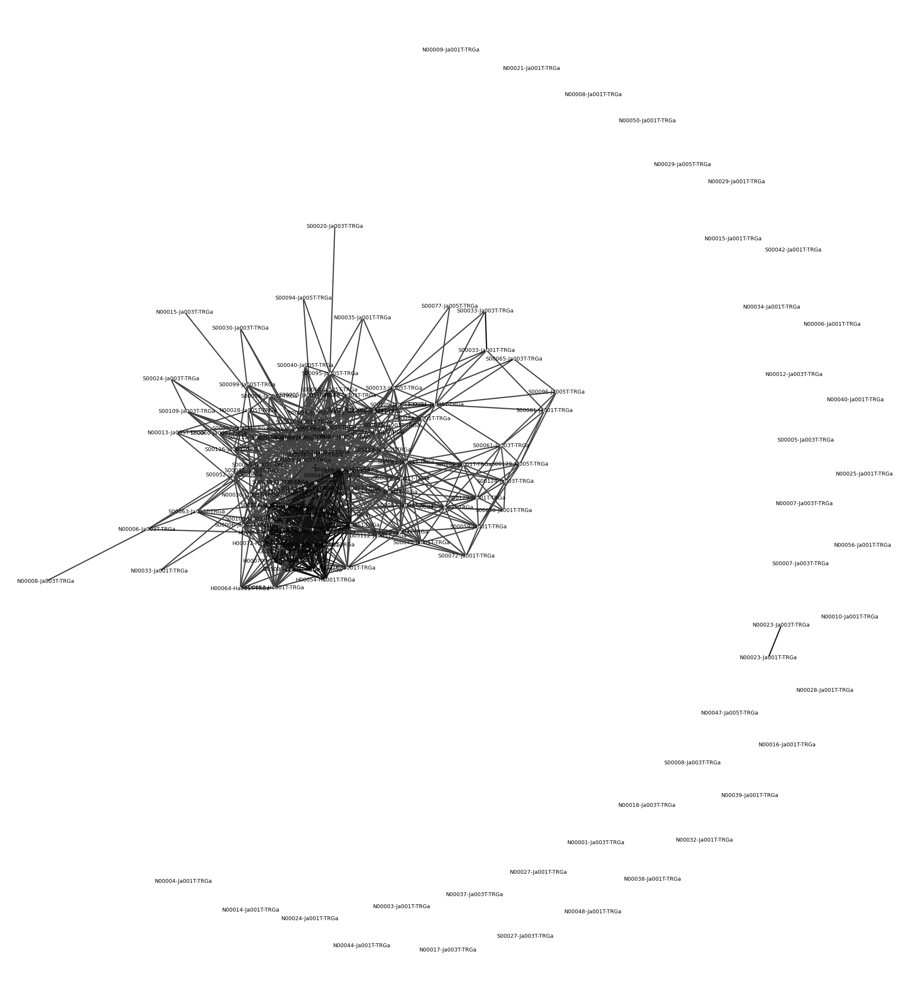

In [21]:
fig, ax = plt.subplots(figsize=(30,30))
ig.plot(
    g,
    target=ax,
    layout="auto", 
    vertex_size=0.03,
    vertex_frame_width=3.0,
    vertex_frame_color="white",
    vertex_label=g.vs["name"],
    vertex_label_size=9.0,
)

plt.show()

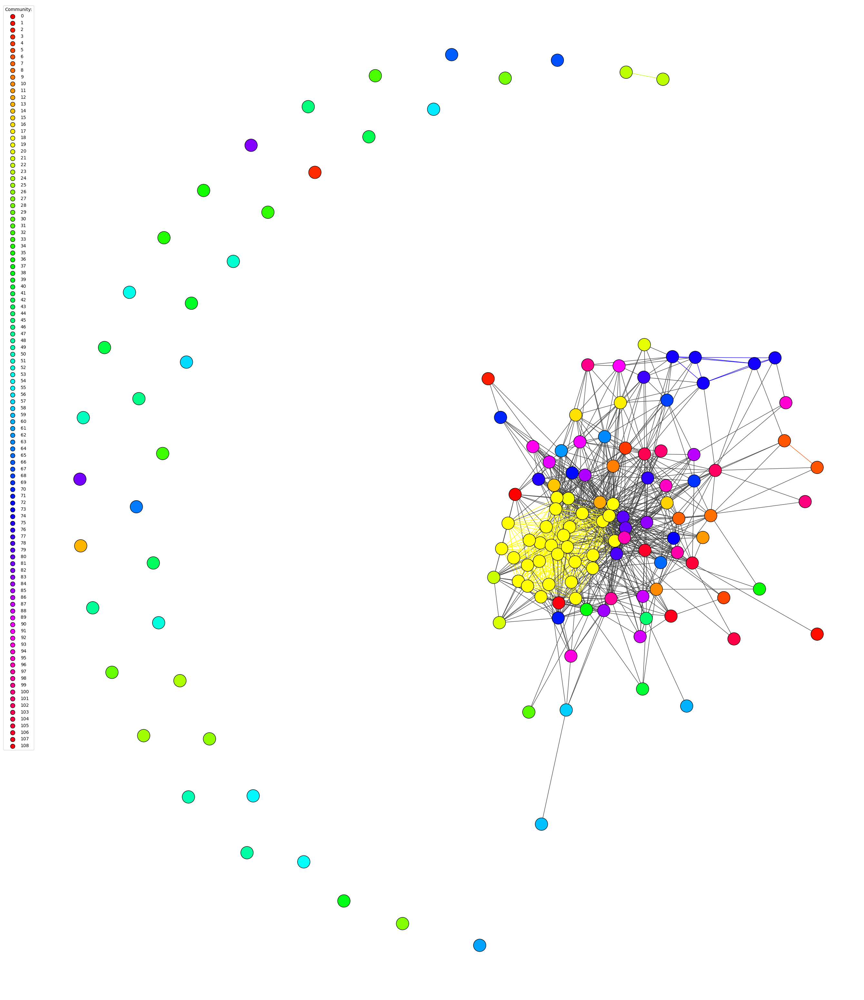

In [22]:
fig, ax = plt.subplots(figsize=(40,40))
ig.plot(
    communities,
    palette=palette,
    edge_width=1,
    target=ax,
    vertex_size=0.3,
)

# Create a custom color legend
legend_handles = []
for i in range(num_communities):
    handle = ax.scatter(
        [], [],
        s=100,
        facecolor=palette.get(i),
        edgecolor="k",
        label=i,
    )
    legend_handles.append(handle)
ax.legend(
    handles=legend_handles,
    title='Community:',
    bbox_to_anchor=(0, 1.0),
    bbox_transform=ax.transAxes,
)
plt.show()

In [23]:
# Original Graph
n_vertices = bulkRNA_graph_sum["grey"]["num_vertices"]
edges = bulkRNA_graph_sum["grey"]["10"]["edges"]

g = ig.Graph(n_vertices, edges)

g["title"] = "bulkRNA Network for grey module and top 10 percent edges"
g.vs["name"] = list(df.columns)

# Communities
communities = g.community_edge_betweenness()
communities = communities.as_clustering()

num_communities = len(communities)
palette = ig.RainbowPalette(n=num_communities)
for i, community in enumerate(communities):
    g.vs[community]["color"] = i
    community_edges = g.es.select(_within=community)
    community_edges["color"] = i

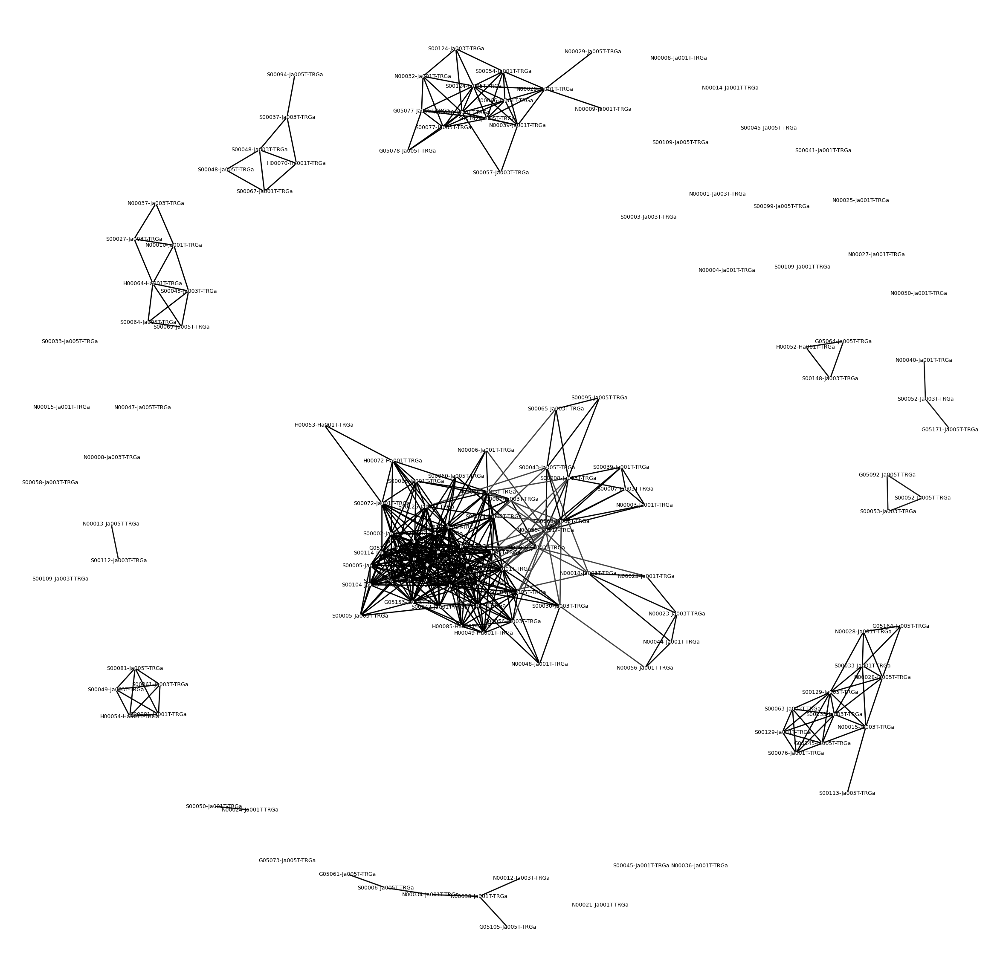

In [24]:
fig, ax = plt.subplots(figsize=(30,30))
ig.plot(
    g,
    target=ax,
    layout="auto", 
    vertex_size=0.03,
    vertex_frame_width=3.0,
    vertex_frame_color="white",
    vertex_label=g.vs["name"],
    vertex_label_size=9.0,
)

plt.show()

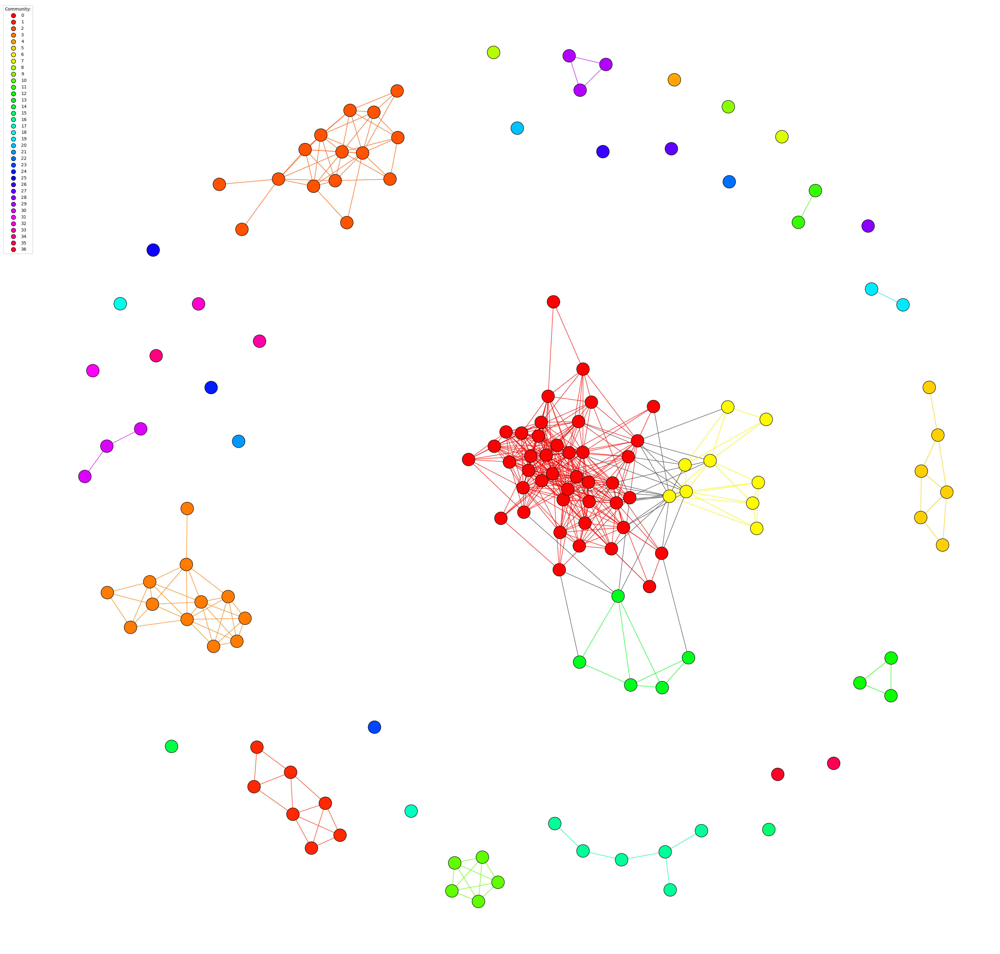

In [25]:
fig, ax = plt.subplots(figsize=(40,40))
ig.plot(
    communities,
    palette=palette,
    edge_width=1,
    target=ax,
    vertex_size=0.3,
)

# Create a custom color legend
legend_handles = []
for i in range(num_communities):
    handle = ax.scatter(
        [], [],
        s=100,
        facecolor=palette.get(i),
        edgecolor="k",
        label=i,
    )
    legend_handles.append(handle)
ax.legend(
    handles=legend_handles,
    title='Community:',
    bbox_to_anchor=(0, 1.0),
    bbox_transform=ax.transAxes,
)
plt.show()

### Luminex

In [26]:
luminex_graph_sum = {}
n_vertices = len(corr_p_luminex.index.unique())
luminex_graph_sum["num_vertices"] = n_vertices

In [27]:
data = corr_p_luminex.to_numpy()
data = np.triu(data) # Avoiding duplicates, since the matrix is symmetric
data = data[data>0] # Discard negative correlation 
data = data[data<1] # Discard correlation with self

In [28]:
percentile = np.percentile(data, 90) 
data_10 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_luminex.iloc[i,j] >= percentile]
luminex_graph_sum["10"] = {"corr_data": data_10, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 95) 
data_5 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_luminex.iloc[i,j] >= percentile]
luminex_graph_sum["5"] = {"corr_data": data_5, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 97) 
data_3 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_luminex.iloc[i,j] >= percentile]
luminex_graph_sum["3"] = {"corr_data": data_3, "percentile_threshhold": percentile, "edges": edges}

percentile = np.percentile(data, 99) 
data_1 = data [data >= percentile] # Extract the top 10% percent correlation  
edges = [(i,j) for i in range(n_vertices) for j in range(i) if corr_p_luminex.iloc[i,j] >= percentile]
luminex_graph_sum["1"] = {"corr_data": data_1, "percentile_threshhold": percentile, "edges": edges}

## Graph Analysis

### FACS

In [29]:
for key in facs_graph_sum.keys():
    if key == "num_vertices":
        num_v = facs_graph_sum["num_vertices"]
    else:
        edges = facs_graph_sum[key]["edges"]
        g = ig.Graph(num_v, edges)
        g["title"] = "FACS Network for Top " + key + " Edges"
        g.vs["name"] = list(corr_p_facs.columns)
        g.vs["disease"] =  [facs.obs.Diseases[facs.obs_names == name][0] for name in g.vs["name"] ]
        g.vs["gender"] =  [facs.uns["experiment_info"][facs.uns["experiment_info"]["scRNASeq_sample_ID"] == name]["Sex"][0] for name in g.vs["name"] ]
        g.vs["age"] = [facs.uns["experiment_info"][facs.uns["experiment_info"]["scRNASeq_sample_ID"] == name]["Age"][0] for name in g.vs["name"] ]

        # Communities
        communities = g.community_edge_betweenness()
        communities = communities.as_clustering()

        num_communities = len(communities)
        palette = ig.RainbowPalette(n=num_communities)
        for i, community in enumerate(communities):
            g.vs[community]["color"] = i
            community_edges = g.es.select(_within=community)
            community_edges["color"] = i

        # Degrees
        d = np.array(g.degree())
        d_non_zero = d[d>0]
        
        facs_graph_sum[key]["graph"] = g 
        facs_graph_sum[key]["num_edges"] = len(edges)
        facs_graph_sum[key]["max_degree"] =  d.max()
        facs_graph_sum[key]["min_degree"] =  d.min()
        facs_graph_sum[key]["min_degree_non_zero"] =  d_non_zero.min()
        facs_graph_sum[key]["mean_degree"] =  d.mean()
        facs_graph_sum[key]["mean_degree_non_zero"] = d_non_zero.mean()
        facs_graph_sum[key]["average_path_length"] = g.average_path_length(directed=False)
        facs_graph_sum[key]["largest_clique_size"]  = g.clique_number()
        facs_graph_sum[key]["density"]  = g.density()
        facs_graph_sum[key]["diameter"]  = g.diameter(directed=False)
        facs_graph_sum[key]["num_communities"] = num_communities
        facs_graph_sum[key]["communities"] = communities
        facs_graph_sum[key]["community_palette"] = palette
        facs_graph_sum[key]["community_edges"] = community_edges
        facs_graph_sum[key]["laplacian"] = np.array(g.laplacian())



In [30]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
stats_10 = [facs_graph_sum["10"][key] for key in stats]
stats_5 = [facs_graph_sum["5"][key] for key in stats]
stats_3 = [facs_graph_sum["3"][key] for key in stats]
stats_1 = [facs_graph_sum["1"][key] for key in stats]

items =list(zip(stats,stats_10,stats_5,stats_3, stats_1))
summary = {list(item)[0]:list(item)[1:] for item in items}
summary["num_vertices"] = [facs_graph_sum["num_vertices"]] * 4
summary["percentile"] = [10,5,3,1]
pd.DataFrame(summary).set_index("percentile")

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,num_vertices
percentile,,,,,,,,,,,,,
10,495,28,0,1,9.90,11.511628,3.044870,12,0.100000,8,38,0.967010,100
5,248,22,0,1,4.96,6.794521,4.051628,8,0.050101,11,40,0.978283,100
3,149,17,0,1,2.98,4.447761,3.070552,6,0.030101,8,46,0.982943,100
1,50,8,0,1,1.00,2.325581,2.809701,5,0.010101,7,69,0.988807,100


### CyTOF

In [31]:
for ct in cytof_graph_sum.keys():
    for key in cytof_graph_sum[ct]:
        if key == "num_vertices":
            num_v = cytof_graph_sum[ct]["num_vertices"]
        else:
            edges = cytof_graph_sum[ct][key]["edges"]
            g = ig.Graph(num_v, edges)
            g["title"] = "CyTOF Network for Top " + key + " Edges and " + ct + " Cell Type"
            g.vs["name"] = list(corr_p_cytof[ct].columns)
            g.vs["disease"] =  [cytof.obs.Diseases[cytof.obs_names == name][0] for name in g.vs["name"] ]
            g.vs["gender"] =  [cytof.uns["experiment_info"][cytof.uns["experiment_info"]["patient_id"] == name]["Sex"][0] for name in g.vs["name"] ]
            g.vs["age"] = [cytof.uns["experiment_info"][cytof.uns["experiment_info"]["patient_id"] == name]["Age"][0] for name in g.vs["name"] ]

            # Communities
            communities = g.community_edge_betweenness()
            communities = communities.as_clustering()

            num_communities = len(communities)
            palette = ig.RainbowPalette(n=num_communities)
            for i, community in enumerate(communities):
                g.vs[community]["color"] = i
                community_edges = g.es.select(_within=community)
                community_edges["color"] = i

            # Degrees
            d = np.array(g.degree())
            d_non_zero = d[d>0]
            
            cytof_graph_sum[ct][key]["graph"] = g 
            cytof_graph_sum[ct][key]["num_edges"] = len(edges)
            cytof_graph_sum[ct][key]["max_degree"] =  d.max()
            cytof_graph_sum[ct][key]["min_degree"] =  d.min()
            cytof_graph_sum[ct][key]["min_degree_non_zero"] =  d_non_zero.min()
            cytof_graph_sum[ct][key]["mean_degree"] =  d.mean()
            cytof_graph_sum[ct][key]["mean_degree_non_zero"] = d_non_zero.mean()
            cytof_graph_sum[ct][key]["average_path_length"] = g.average_path_length(directed=False)
            cytof_graph_sum[ct][key]["largest_clique_size"]  = g.clique_number()
            cytof_graph_sum[ct][key]["density"]  = g.density()
            cytof_graph_sum[ct][key]["diameter"]  = g.diameter(directed=False)
            cytof_graph_sum[ct][key]["num_communities"] = num_communities
            cytof_graph_sum[ct][key]["communities"] = communities
            cytof_graph_sum[ct][key]["community_palette"] = palette
            cytof_graph_sum[ct][key]["community_edges"] = community_edges
            cytof_graph_sum[ct][key]["laplacian"] = np.array(g.laplacian())



In [70]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
cts = list(cytof_graph_sum.keys()) * 4
percentiles = np.array([["10"] * len(cytof_graph_sum.keys()), ["5"] * len(cytof_graph_sum.keys()), ["3"] * len(cytof_graph_sum.keys()), ["1"] * len(cytof_graph_sum.keys())]).flatten()
summary = {key:[0]* len(cts) for key in stats}
summary["cell types"] = cts
summary["percentile"] = percentiles
summary["num_vertices"] = [0] * len(cts)

for i, ct in enumerate(cts):
    summary["num_vertices"][i] = cytof_graph_sum[ct]["num_vertices"]
    for stat in stats:
        summary[stat][i] = cytof_graph_sum[ct][percentiles[i]][stat]

pd.DataFrame(summary)

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,cell types,percentile,num_vertices
0,1272,47,0,1,15.900000,16.960000,2.872674,14,0.100000,8,34,0.990373,CD8,10,160
1,1272,53,0,1,15.900000,18.302158,2.330165,13,0.100000,6,108,0.991913,B,10,160
2,1272,49,0,1,15.900000,17.544828,2.634331,16,0.100000,7,36,0.991115,cMono,10,160
3,1272,57,0,1,15.900000,18.844444,2.495202,16,0.100000,7,89,0.995737,CD4,10,160
4,1272,55,0,1,15.900000,17.666667,2.615861,17,0.100000,7,87,0.986471,GDT,10,160
5,1272,56,0,1,15.900000,17.915493,2.511987,15,0.100000,7,84,0.991116,DC,10,160
6,1257,51,0,1,15.811321,18.086331,2.506934,12,0.100072,8,91,0.990247,Basophil,10,159
7,1272,61,0,1,15.900000,17.189189,2.494668,11,0.100000,7,41,0.989006,NK,10,160
8,1272,58,0,1,15.900000,18.302158,2.385653,14,0.100000,7,111,0.987215,ncMono,10,160
9,1272,63,0,1,15.900000,18.302158,2.396817,15,0.100000,7,102,0.991847,MAIT,10,160


### ADT

In [32]:
for ct in adt_graph_sum.keys():
    for key in adt_graph_sum[ct]:
        if key == "num_vertices":
            num_v = adt_graph_sum[ct]["num_vertices"]
        else:
            edges = adt_graph_sum[ct][key]["edges"]
            g = ig.Graph(num_v, edges)
            g["title"] = "ADT Network for Top " + key + " Edges and " + ct + " Cell Type"
            g.vs["name"] = list(corr_p_adt[ct].columns)
            g.vs["disease"] =  [adt.obs.Diseases[adt.obs_names == name][0] for name in g.vs["name"] ]
            g.vs["gender"] =  [adt.obs.Sex[adt.obs_names == name][0] for name in g.vs["name"] ]
            g.vs["age"] = [adt.obs.Age[adt.obs_names == name][0] for name in g.vs["name"] ]

            # Communities
            communities = g.community_edge_betweenness()
            communities = communities.as_clustering()

            num_communities = len(communities)
            palette = ig.RainbowPalette(n=num_communities)
            for i, community in enumerate(communities):
                g.vs[community]["color"] = i
                community_edges = g.es.select(_within=community)
                community_edges["color"] = i

            # Degrees
            d = np.array(g.degree())
            d_non_zero = d[d>0]
            
            adt_graph_sum[ct][key]["graph"] = g 
            adt_graph_sum[ct][key]["num_edges"] = len(edges)
            adt_graph_sum[ct][key]["max_degree"] =  d.max()
            adt_graph_sum[ct][key]["min_degree"] =  d.min()
            adt_graph_sum[ct][key]["min_degree_non_zero"] =  d_non_zero.min()
            adt_graph_sum[ct][key]["mean_degree"] =  d.mean()
            adt_graph_sum[ct][key]["mean_degree_non_zero"] = d_non_zero.mean()
            adt_graph_sum[ct][key]["average_path_length"] = g.average_path_length(directed=False)
            adt_graph_sum[ct][key]["largest_clique_size"]  = g.clique_number()
            adt_graph_sum[ct][key]["density"]  = g.density()
            adt_graph_sum[ct][key]["diameter"]  = g.diameter(directed=False)
            adt_graph_sum[ct][key]["num_communities"] = num_communities
            adt_graph_sum[ct][key]["communities"] = communities
            adt_graph_sum[ct][key]["community_palette"] = palette
            adt_graph_sum[ct][key]["community_edges"] = community_edges
            adt_graph_sum[ct][key]["laplacian"] = np.array(g.laplacian())



In [68]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
cts = list(adt_graph_sum.keys()) * 4
percentiles = np.array([["10"] * len(adt_graph_sum.keys()), ["5"] * len(adt_graph_sum.keys()), ["3"] * len(adt_graph_sum.keys()), ["1"] * len(adt_graph_sum.keys())]).flatten()
summary = {key:[0]* len(cts) for key in stats}
summary["cell types"] = cts
summary["percentile"] = percentiles
summary["num_vertices"] = [0] * len(cts)

for i, ct in enumerate(cts):
    summary["num_vertices"][i] = adt_graph_sum[ct]["num_vertices"]
    for stat in stats:
        summary[stat][i] = adt_graph_sum[ct][percentiles[i]][stat]

pd.DataFrame(summary)

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,cell types,percentile,num_vertices
0,946,55,0,1,13.710145,14.897638,2.347450,12,0.100074,5,66,0.952319,NK,10,138
1,946,40,0,1,13.710145,14.897638,2.820647,12,0.100074,8,30,0.960924,CD8,10,138
2,973,54,0,1,13.900000,15.821138,2.593710,12,0.100000,8,67,0.919046,nan,10,140
3,946,39,0,1,13.710145,16.170940,2.666225,13,0.100074,8,31,0.945150,ncMono,10,138
4,946,42,0,1,13.710145,14.442748,2.735982,11,0.100074,9,30,0.945771,cMono,10,138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,86,11,0,1,1.312977,4.300000,2.632911,4,0.010100,6,105,0.968210,HSC,1,131
68,94,13,0,1,1.372263,3.481481,4.594714,5,0.010090,12,92,0.966492,DC,1,137
69,71,8,0,1,1.193277,3.550000,4.017949,5,0.010113,9,88,0.969579,PLT,1,119
70,16,5,0,1,0.561404,2.133333,2.020408,3,0.010025,4,46,0.975837,RET,1,57


### citeRNA

In [33]:
for ct in citeRNA_graph_sum.keys():
    for key in citeRNA_graph_sum[ct]:
        if key == "num_vertices":
            num_v = citeRNA_graph_sum[ct]["num_vertices"]
        else:
            edges = citeRNA_graph_sum[ct][key]["edges"]
            g = ig.Graph(num_v, edges)
            g["title"] = "citeRNA Network for Top " + key + " Edges and " + ct + " Module-Cell-Type Pair"
            g.vs["name"] = list(corr_p_citeRNA[ct].columns)
            g.vs["disease"] =  [scRNA.obs.Diseases[scRNA.obs_names == name][0] for name in g.vs["name"] ]
            g.vs["gender"] =  [scRNA.obs.Sex[scRNA.obs_names == name][0] for name in g.vs["name"] ]
            g.vs["age"] = [scRNA.obs.Age[scRNA.obs_names == name][0] for name in g.vs["name"] ]

            # Communities
            communities = g.community_edge_betweenness()
            communities = communities.as_clustering()

            num_communities = len(communities)
            palette = ig.RainbowPalette(n=num_communities)
            for i, community in enumerate(communities):
                g.vs[community]["color"] = i
                community_edges = g.es.select(_within=community)
                community_edges["color"] = i

            # Degrees
            d = np.array(g.degree())
            d_non_zero = d[d>0]
            
            citeRNA_graph_sum[ct][key]["graph"] = g 
            citeRNA_graph_sum[ct][key]["num_edges"] = len(edges)
            citeRNA_graph_sum[ct][key]["max_degree"] =  d.max()
            citeRNA_graph_sum[ct][key]["min_degree"] =  d.min()
            citeRNA_graph_sum[ct][key]["min_degree_non_zero"] =  d_non_zero.min()
            citeRNA_graph_sum[ct][key]["mean_degree"] =  d.mean()
            citeRNA_graph_sum[ct][key]["mean_degree_non_zero"] = d_non_zero.mean()
            citeRNA_graph_sum[ct][key]["average_path_length"] = g.average_path_length(directed=False)
            citeRNA_graph_sum[ct][key]["largest_clique_size"]  = g.clique_number()
            citeRNA_graph_sum[ct][key]["density"]  = g.density()
            citeRNA_graph_sum[ct][key]["diameter"]  = g.diameter(directed=False)
            citeRNA_graph_sum[ct][key]["num_communities"] = num_communities
            citeRNA_graph_sum[ct][key]["communities"] = communities
            citeRNA_graph_sum[ct][key]["community_palette"] = palette
            citeRNA_graph_sum[ct][key]["community_edges"] = community_edges
            citeRNA_graph_sum[ct][key]["laplacian"] = np.array(g.laplacian())



In [67]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
modules = list(citeRNA_graph_sum.keys()) * 4
percentiles = np.array([["10"] * len(citeRNA_graph_sum.keys()), ["5"] * len(citeRNA_graph_sum.keys()), ["3"] * len(citeRNA_graph_sum.keys()), ["1"] * len(citeRNA_graph_sum.keys())]).flatten()
summary = {key:[0]* len(modules) for key in stats}
summary["cell types - modules"] = modules
summary["percentile"] = percentiles
summary["num_vertices"] = [0] * len(modules)

for i, module in enumerate(modules):
    summary["num_vertices"][i] = citeRNA_graph_sum[module]["num_vertices"]
    for stat in stats:
        summary[stat][i] = citeRNA_graph_sum[module][percentiles[i]][stat]

pd.DataFrame(summary)

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,cell types - modules,percentile,num_vertices
0,946,54,0,1,13.710145,15.636364,2.295891,14,0.100074,6,61,0.995755,NK-greenyellow,10,138
1,946,56,0,1,13.710145,16.310345,2.424459,14,0.100074,6,74,0.984113,NK-tan,10,138
2,876,53,0,1,12.695652,26.545455,1.999068,28,0.092669,6,74,0.726846,NK-red,10,138
3,946,52,0,1,13.710145,16.892857,2.407236,16,0.100074,9,76,0.979913,NK-turquoise,10,138
4,946,51,0,1,13.710145,15.899160,2.293674,15,0.100074,6,79,0.986584,NK-green,10,138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,10,6,0,1,0.465116,2.857143,1.523810,3,0.011074,2,37,0.739122,Mast-yellow,1,43
1436,10,4,0,1,0.465116,2.857143,1.090909,4,0.011074,2,38,0.964906,Mast-magenta,1,43
1437,10,6,0,1,0.465116,2.500000,1.714286,3,0.011074,3,36,0.790333,Mast-cyan,1,43
1438,10,6,0,1,0.465116,2.500000,1.714286,3,0.011074,3,36,0.953748,Mast-midnightblue,1,43


### bulkRNA

In [34]:
for m in bulkRNA_graph_sum.keys():
    for key in bulkRNA_graph_sum[m]:
        if key == "num_vertices":
            num_v = bulkRNA_graph_sum[m]["num_vertices"]
        else:
            edges = bulkRNA_graph_sum[m][key]["edges"]
            g = ig.Graph(num_v, edges)
            g["title"] = "bulkRNA Network for Top " + key + " Edges and " + m + " Module"
            g.vs["name"] = list(corr_p_bulkRNA[m].columns)

            # Communities
            communities = g.community_edge_betweenness()
            communities = communities.as_clustering()

            num_communities = len(communities)
            palette = ig.RainbowPalette(n=num_communities)
            for i, community in enumerate(communities):
                g.vs[community]["color"] = i
                community_edges = g.es.select(_within=community)
                community_edges["color"] = i

            # Degrees
            d = np.array(g.degree())
            d_non_zero = d[d>0]
            
            bulkRNA_graph_sum[m][key]["graph"] = g 
            bulkRNA_graph_sum[m][key]["num_edges"] = len(edges)
            bulkRNA_graph_sum[m][key]["max_degree"] =  d.max()
            bulkRNA_graph_sum[m][key]["min_degree"] =  d.min()
            bulkRNA_graph_sum[m][key]["min_degree_non_zero"] =  d_non_zero.min()
            bulkRNA_graph_sum[m][key]["mean_degree"] =  d.mean()
            bulkRNA_graph_sum[m][key]["mean_degree_non_zero"] = d_non_zero.mean()
            bulkRNA_graph_sum[m][key]["average_path_length"] = g.average_path_length(directed=False)
            bulkRNA_graph_sum[m][key]["largest_clique_size"]  = g.clique_number()
            bulkRNA_graph_sum[m][key]["density"]  = g.density()
            bulkRNA_graph_sum[m][key]["diameter"]  = g.diameter(directed=False)
            bulkRNA_graph_sum[m][key]["num_communities"] = num_communities
            bulkRNA_graph_sum[m][key]["communities"] = communities
            bulkRNA_graph_sum[m][key]["community_palette"] = palette
            bulkRNA_graph_sum[m][key]["community_edges"] = community_edges
            bulkRNA_graph_sum[m][key]["laplacian"] = np.array(g.laplacian())



In [62]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
modules = list(bulkRNA_graph_sum.keys()) * 4
percentiles = np.array([["10"] * len(bulkRNA_graph_sum.keys()), ["5"] * len(bulkRNA_graph_sum.keys()), ["3"] * len(bulkRNA_graph_sum.keys()), ["1"] * len(bulkRNA_graph_sum.keys())]).flatten()
summary = {key:[0]* len(modules) for key in stats}
summary["modules"] = modules
summary["percentile"] = percentiles
summary["num_vertices"] = [0] * len(modules)

for i, module in enumerate(modules):
    summary["num_vertices"][i] = bulkRNA_graph_sum[module]["num_vertices"]
    for stat in stats:
        summary[stat][i] = bulkRNA_graph_sum[module][percentiles[i]][stat]

pd.DataFrame(summary)

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,modules,percentile,num_vertices
0,1016,39,0,1,14.209790,16.256000,2.953677,15,0.100069,8,30,0.969573,greenyellow,10,143
1,1016,46,0,1,14.209790,17.982301,2.396823,16,0.100069,7,44,0.979286,green,10,143
2,1016,40,0,1,14.209790,16.126984,2.985860,21,0.100069,9,28,0.983636,magenta,10,143
3,1016,49,0,1,14.209790,16.387097,2.541452,12,0.100069,7,85,0.989068,lightgreen,10,143
4,1016,48,0,1,14.209790,19.169811,2.352028,16,0.100069,6,83,0.989578,black,10,143
5,1016,49,0,1,14.209790,18.642202,2.269217,15,0.100069,6,100,0.981104,turquoise,10,143
6,1016,45,0,1,14.209790,16.933333,2.750140,17,0.100069,7,40,0.987966,lightcyan,10,143
7,1016,53,0,1,14.209790,18.642202,2.183266,17,0.100069,5,103,0.986522,midnightblue,10,143
8,1016,52,0,1,14.209790,18.814815,2.338484,17,0.100069,5,90,0.986784,blue,10,143
9,1016,41,0,1,14.209790,16.126984,3.013300,14,0.100069,8,36,0.959521,grey60,10,143


### Luminex

In [35]:
for key in luminex_graph_sum.keys():
    if key == "num_vertices":
        num_v = luminex_graph_sum["num_vertices"]
    else:
        edges = luminex_graph_sum[key]["edges"]
        g = ig.Graph(num_v, edges)
        g["title"] = "Luminex Network for Top " + key + " Edges"
        g.vs["name"] = list(corr_p_luminex.columns)
        g.vs["disease"] =  [luminex.obs.Disease[luminex.obs.PID == name][0] for name in g.vs["name"] ]
        g.vs["gender"] =  [luminex.obs.Sex[luminex.obs.PID == name][0] for name in g.vs["name"] ]
        g.vs["age"] = [luminex.obs.Age[luminex.obs.PID == name][0] for name in g.vs["name"] ]

        # Communities
        communities = g.community_edge_betweenness()
        communities = communities.as_clustering()

        num_communities = len(communities)
        palette = ig.RainbowPalette(n=num_communities)
        for i, community in enumerate(communities):
            g.vs[community]["color"] = i
            community_edges = g.es.select(_within=community)
            community_edges["color"] = i

        # Degrees
        d = np.array(g.degree())
        d_non_zero = d[d>0]
        
        luminex_graph_sum[key]["graph"] = g 
        luminex_graph_sum[key]["num_edges"] = len(edges)
        luminex_graph_sum[key]["max_degree"] =  d.max()
        luminex_graph_sum[key]["min_degree"] =  d.min()
        luminex_graph_sum[key]["min_degree_non_zero"] =  d_non_zero.min()
        luminex_graph_sum[key]["mean_degree"] =  d.mean()
        luminex_graph_sum[key]["mean_degree_non_zero"] = d_non_zero.mean()
        luminex_graph_sum[key]["average_path_length"] = g.average_path_length(directed=False)
        luminex_graph_sum[key]["largest_clique_size"]  = g.clique_number()
        luminex_graph_sum[key]["density"]  = g.density()
        luminex_graph_sum[key]["diameter"]  = g.diameter(directed=False)
        luminex_graph_sum[key]["num_communities"] = num_communities
        luminex_graph_sum[key]["communities"] = communities
        luminex_graph_sum[key]["community_palette"] = palette
        luminex_graph_sum[key]["community_edges"] = community_edges
        luminex_graph_sum[key]["laplacian"] = np.array(g.laplacian())   

In [36]:
stats = ["num_edges", "max_degree", "min_degree", "min_degree_non_zero", "mean_degree", "mean_degree_non_zero", "average_path_length", "largest_clique_size", "density", "diameter", "num_communities", "percentile_threshhold" ]
stats_10 = [luminex_graph_sum["10"][key] for key in stats]
stats_5 = [luminex_graph_sum["5"][key] for key in stats]
stats_3 = [luminex_graph_sum["3"][key] for key in stats]
stats_1 = [luminex_graph_sum["1"][key] for key in stats]

items =list(zip(stats,stats_10,stats_5,stats_3, stats_1))
summary = {list(item)[0]:list(item)[1:] for item in items}
summary["num_vertices"] = [luminex_graph_sum["num_vertices"]] * 4
summary["percentile"] = [10,5,3,1]
pd.DataFrame(summary).set_index("percentile")

,num_edges,max_degree,min_degree,min_degree_non_zero,mean_degree,mean_degree_non_zero,average_path_length,largest_clique_size,density,diameter,num_communities,percentile_threshhold,num_vertices
percentile,,,,,,,,,,,,,
10,6073,122,0,1,34.802292,41.172881,2.514785,46,0.100007,11,206,0.990862,349
5,3037,77,0,1,17.404011,23.542636,2.682663,28,0.050012,12,133,0.994622,349
3,1822,56,0,1,10.441261,16.195556,3.099093,19,0.030004,9,157,0.996214,349
1,608,29,0,1,3.484241,7.414634,4.056553,10,0.010012,11,213,0.998066,349
